In [1]:
%config InlineBackend.figure_format='retina'

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import re
import os 
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns


Bad key "text.kerning_factor" on line 4 in
/opt/miniconda3/envs/py37/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


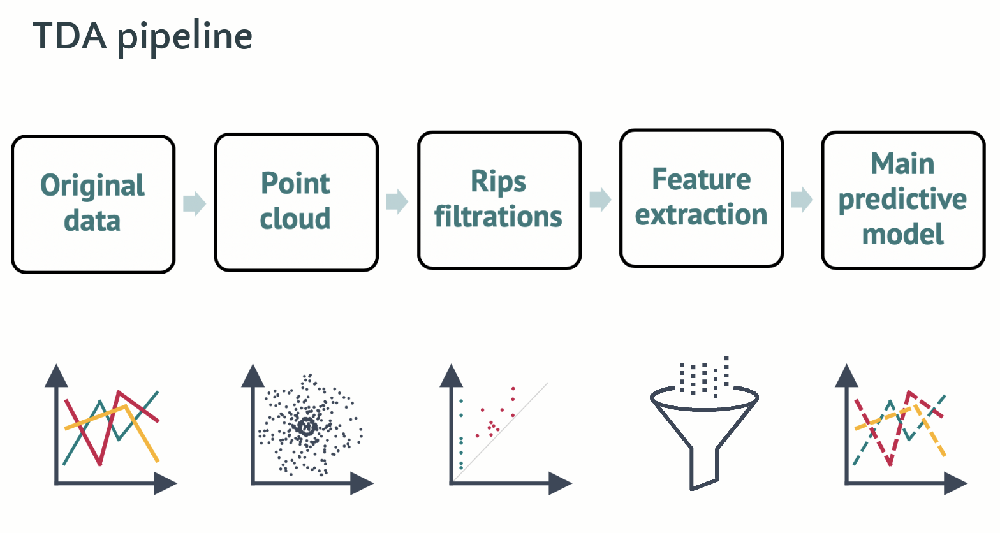

# Загрузка данных

In [4]:
Data = pd.read_csv("../Probe_Data/Febraury_PredData.csv", index_col=0)

In [5]:
def SetShiftTarget(Data, delta):
    """
    Сдвигает изначальный таргет на delta шагов назад
    Шаг дискретизации по времени : 5 минут
    """
    Data['shift_target'] = Data.target.shift(-delta).values
    Data.fillna(0, inplace=True)
    return Data

In [46]:
inds = Data[Data["Вибрация переднего подшипника двигателя (осевая)"] < 10.0].index
Data['target'][inds] = 1.0
Data = SetShiftTarget(Data, 36)

X = Data.drop(['target', 'shift_target'], axis=1)
y = Data['shift_target']

In [122]:
Data.drop(['target', 'shift_target'], axis=1)

,Температура обмотки статора А (датчик №1),Температура обмотки статора А (датчик №2),Температура обмотки статора В (датчик №1),Температура обмотки статора В (датчик №2),Температура обмотки статора С (датчик №1),Температура обмотки статора С (датчик №2),Температура переднего подшипника двигателя,Температура заднего подшипника двигателя,Давление в масляном домкрате (передний подшипник),Давление в масляном домкрате (задний подшипник),Вибрация переднего подшипника двигателя (осевая),Вибрация переднего подшипника двигателя (радиальная),Вибрация заднего подшипника двигателя (осевая),Вибрация заднего подшипника двигателя (радиальная)
2020-01-31 00:12:24.900,46.9419,46.6101,45.9382,46.2909,44.5909,44.3468,39.4278,41.1187,3.75434,0.094039,39.1710,55.0673,16.5582,26.1502
2020-01-31 00:17:24.900,47.1589,46.8244,45.9925,46.4084,44.6632,44.4103,39.4286,41.2070,3.75434,0.115742,39.3989,55.1327,16.3952,25.6834
2020-01-31 00:22:24.900,47.2042,46.7975,46.1003,46.5199,44.8423,44.5548,38.9938,40.9921,3.68200,0.115841,37.3900,49.9019,19.3468,23.9800
2020-01-31 00:27:24.900,46.8605,46.4988,45.6398,46.0829,44.6542,44.3558,38.4784,40.6666,3.47222,0.122975,33.5937,46.9510,19.5638,23.8390
2020-01-31 00:32:24.900,46.5893,46.3180,45.5223,45.9653,44.3739,44.2398,38.4209,40.6939,3.34925,0.122975,33.6371,48.1884,18.7717,23.4579
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-02-29 20:27:22.700,50.3418,49.8716,48.6418,49.0668,46.5079,46.3451,42.0320,42.0319,3.94967,0.101273,57.0364,51.5953,18.3485,29.2426
2020-02-29 20:32:22.700,50.7125,50.2966,48.7232,49.2566,46.6168,46.3828,41.9958,42.0320,3.55179,0.101273,55.5881,51.0634,16.6775,28.7109
2020-02-29 20:37:22.700,51.0923,50.5971,49.0195,49.4285,46.7249,46.4084,42.1767,41.9958,3.23351,0.086807,58.8868,55.0685,16.9623,29.2110
2020-02-29 20:42:22.700,51.3093,50.8120,49.0307,49.5551,46.7520,46.5350,42.5926,41.9956,3.07446,0.055785,57.3997,53.8194,17.7083,28.8520


## Генерация фичей

### Попарные корреляции

In [7]:
WINDOW_SIZE = 20

corr_X = X.rolling(window = WINDOW_SIZE).corr()

In [8]:
from itertools import product, combinations

Sensors_Combs = list(combinations(X.columns, r=2))
CorrFeatures = pd.DataFrame()

for sens_1, sens_2 in Sensors_Combs:

    # Выбираем из датафрейма, корреляцию за все время пары датчиков `sens_1` и `sens_2`
    corr_series = corr_X[sens_1].loc[:, sens_2]

    # Так как использовалась оконная функция в начале есть пропуски
    # Заполним их случайными величинами из диапазона [MIN, MAX] для данного ряда
    MAX, MIN = corr_series.max(), corr_series.min()
    fill_values = np.random.sample(size=WINDOW_SIZE - 1) * (MAX - MIN) + MIN
    corr_series[:WINDOW_SIZE - 1] = fill_values

    # Все такие новые колонки с попарными корреляциями датчиков
    # Будут начинаться с `Corr_`
    corr_series.name = '_'.join(['Corr', sens_1, sens_2])

    CorrFeatures = pd.concat([CorrFeatures, corr_series], axis=1)

### TDA

In [9]:
from ripser import Rips
from persim import PersImage

In [11]:
from tqdm.notebook import tqdm


def get_point_cloud(timeseries, window_size=48, window_step=4):
    PC = np.array([
        timeseries[i:i + window_size].to_list()
        for i in range(0,
                       len(timeseries) - window_size, window_step)
    ])
    return PC


def get_TDA_features(timeseries, window_size=288):

    TopologicalFeatures = []
    err_cnt = 0
    for i in tqdm(range(0,
                        len(timeseries) - window_size),
                  total=len(timeseries) - window_size):

        PointCloud = get_point_cloud(timeseries=timeseries[i:i + window_size],
                                     window_size=36)

        rips = Rips(maxdim=1, coeff=2, verbose=False)
        T_Data = rips.fit_transform(PointCloud)[-1]

        try:
            Mean_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).mean()
            Std_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).std()
            Max_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).max()
            Min_LifeTime = (T_Data[:, 1] - T_Data[:, 0]).min()
        except:
            err_cnt += 1
            Mean_LifeTime, Std_LifeTime, Max_LifeTime, Min_LifeTime = np.nan, np.nan, np.nan, np.nan

        TopologicalFeatures.append(
            [Mean_LifeTime, Std_LifeTime, Max_LifeTime, Min_LifeTime])
    print(f"Errors : {err_cnt}")

    TopologicalFeatures = np.array(TopologicalFeatures)
    TopologicalFeatures = np.pad(TopologicalFeatures,
                                 pad_width=((window_size, 0), (0, 0)))

    return np.array(TopologicalFeatures)

In [12]:
TDA_Features = pd.DataFrame()

feature_columns = ["LT_mean", "LT_std", "LT_max", "LT_min"]
for SensName in Data.columns[:-2]:
    _TS = Data[SensName]
    print(SensName)
    _TDA = pd.DataFrame(get_TDA_features(_TS),
                        columns=[f"{feature}_{SensName}" for feature in feature_columns])
    print("="*20)
    
    TDA_Features = pd.concat([TDA_Features, _TDA], axis=1)
    
TDA_Features.index = Data.index

Температура обмотки статора А (датчик №1)



Errors : 0
Температура обмотки статора А (датчик №2)



Errors : 0
Температура обмотки статора В (датчик №1)



Errors : 0
Температура обмотки статора В (датчик №2)



Errors : 0
Температура обмотки статора С (датчик №1)



Errors : 0
Температура обмотки статора С (датчик №2)



Errors : 0
Температура переднего подшипника двигателя



Errors : 1
Температура заднего подшипника двигателя



Errors : 193
Давление в масляном домкрате (передний подшипник)



Errors : 0
Давление в масляном домкрате (задний подшипник)



Errors : 131
Вибрация переднего подшипника двигателя (осевая)



Errors : 0
Вибрация переднего подшипника двигателя (радиальная)



Errors : 0
Вибрация заднего подшипника двигателя (осевая)



Errors : 0
Вибрация заднего подшипника двигателя (радиальная)



Errors : 0


### Производная по показаниям датчиков

In [35]:
from sklearn.impute import SimpleImputer, KNNImputer

imputer = SimpleImputer()
Diff_Features = pd.DataFrame(imputer.fit_transform(X.diff()),
                             columns=["diff_"+col_name for col_name in X.columns],
                             index=X.index)

### Отношение текущего к предыдущему

In [49]:
divider = SimpleImputer().fit_transform(X.shift())

Partion_Features = pd.DataFrame(
    X.values / divider,
    columns=["part_" + col_name for col_name in X.columns],
    index=X.index
)

## Объединение признаков

In [53]:
X = pd.concat([X, CorrFeatures, TDA_Features, Diff_Features, Partion_Features], axis=1)

## Заполнение NaN

In [55]:
from sklearn.impute import SimpleImputer, KNNImputer

imputer = KNNImputer()
X = pd.DataFrame(imputer.fit_transform(X), columns=X.columns, index=X.index)

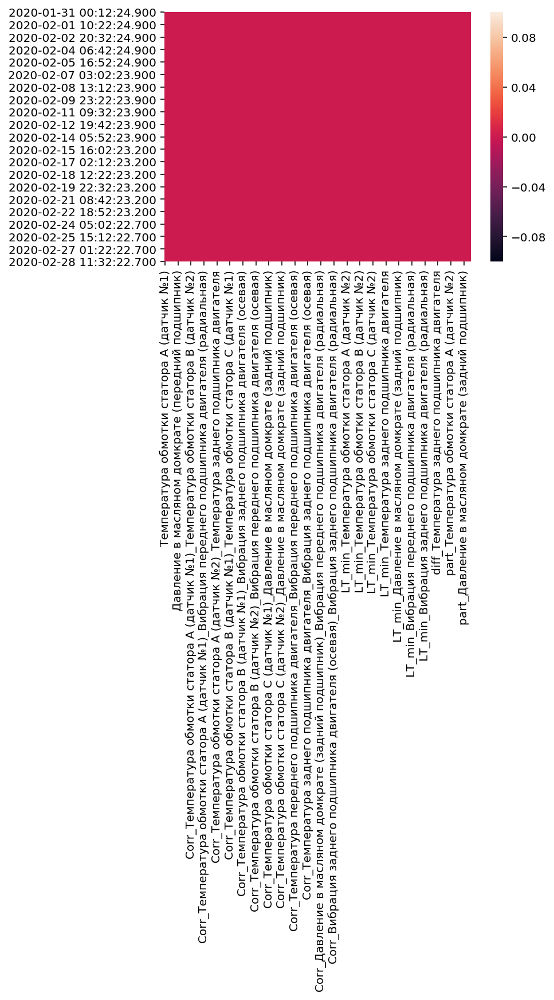

In [56]:
sns.heatmap(X.isna())

##  Стандартизация

In [57]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler()
X = pd.DataFrame(ss.fit_transform(X), columns=X.columns, index=X.index)

In [58]:
Val_X, Exam_X = X.loc[:"2020-02-20"], X.loc["2020-02-20":]
Val_y, Exam_y = y.loc[:"2020-02-20"], y.loc["2020-02-20":]

# Классификатор аномалий

In [1]:
from xgboost import XGBRegressor, XGBRFRegressor, XGBClassifier, XGBRFClassifier

from sklearn.model_selection import cross_validate, train_test_split
from sklearn.metrics import jaccard_similarity_score as IoU
from sklearn.metrics import classification_report, roc_auc_score, f1_score

## XGBoost Random Forest

### Подбор параметров на кросс-валидации

In [61]:
from tqdm.notebook import tqdm

Params = {
    "n_estimators": 10,
    "max_depth": 3,
    "booster": 'gbtree',
    "n_jobs": -1
}

N_EST_ARR = range(100, 160, 10)
MAX_DEPTH_ARR = range(2, 9)

param_comb = list(product(N_EST_ARR, MAX_DEPTH_ARR))
best_f1, best_roc_auc, best_jaccard = 0.0, 0.0, 0.0
RESULTS = []

for n_est, max_depth in tqdm(param_comb):

    Params['n_estimators'] = n_est
    Params['max_depth'] = max_depth

    CLF = XGBRFClassifier(**Params)
    CV_result = cross_validate(
        CLF,
        Val_X,
        Val_y,
        scoring=['f1', 'roc_auc', 'jaccard_weighted'],
        return_train_score=True,
        return_estimator=True)

    #======================================================================#
    # Сохранение результатов и метрик
    #======================================================================#
    res = dict()
    res['params'] = Params

    for part, metric in product(["train", "test"],
                                ["f1", "roc_auc", "jaccard_weighted"]):
        res[f"{part}_avg_{metric}"] = CV_result[f"{part}_{metric}"].mean()
        res[f"{part}_std_{metric}"] = CV_result[f"{part}_{metric}"].std()

    if res["test_avg_jaccard_weighted"] > best_jaccard:
        best_jaccard = res["test_avg_jaccard_weighted"]
        best_est = CV_result["estimator"]

    RESULTS.append(res)

    #======================================================================#

In [62]:
!telegram-send "IoU : {best_jaccard}"

In [63]:
RESULTS = pd.DataFrame(RESULTS)

In [64]:
RESULTS

,params,train_avg_f1,train_std_f1,train_avg_roc_auc,train_std_roc_auc,train_avg_jaccard_weighted,train_std_jaccard_weighted,test_avg_f1,test_std_f1,test_avg_roc_auc,test_std_roc_auc,test_avg_jaccard_weighted,test_std_jaccard_weighted
0,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.372692,0.056386,0.819050,0.027839,0.907896,0.005268,0.004461,0.008922,0.552407,0.139165,0.846537,0.061399
1,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.452163,0.056071,0.851487,0.033998,0.916645,0.004924,0.004096,0.008191,0.513482,0.132013,0.818747,0.079676
2,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.541543,0.041074,0.902078,0.020785,0.925846,0.004508,0.003883,0.007767,0.520375,0.150962,0.827718,0.075522
3,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.669509,0.026635,0.934357,0.021627,0.940712,0.003302,0.067703,0.076999,0.493852,0.122740,0.830832,0.079781
4,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.769090,0.049099,0.961972,0.013778,0.955607,0.007428,0.077754,0.089344,0.463557,0.114793,0.825289,0.076919
5,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.836349,0.028613,0.981425,0.003952,0.966570,0.004933,0.068905,0.077123,0.437593,0.122019,0.816122,0.075239
6,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.857404,0.015799,0.990616,0.001539,0.970234,0.002905,0.071854,0.068472,0.428323,0.129067,0.814143,0.073560
7,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.372692,0.056386,0.820900,0.029437,0.907896,0.005268,0.004461,0.008922,0.531211,0.120806,0.846537,0.061399
8,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.452420,0.056155,0.852382,0.034629,0.916700,0.004940,0.004082,0.008163,0.515790,0.136984,0.819236,0.079262
9,"{'n_estimators': 150, 'max_depth': 8, 'booster...",0.545027,0.046254,0.904633,0.018246,0.926265,0.005142,0.003810,0.007619,0.519276,0.150145,0.830980,0.076075


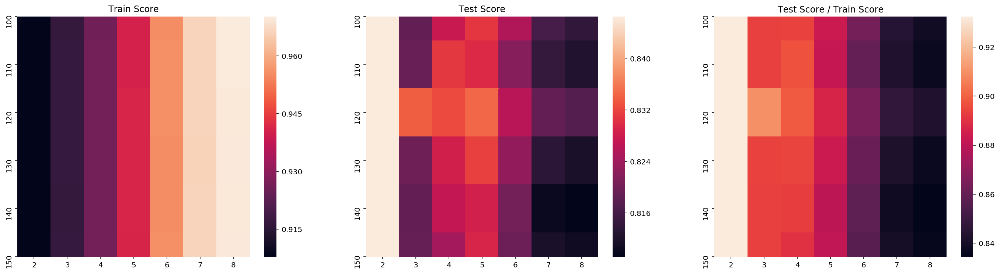

In [65]:
AVG_Train_Jaccard = RESULTS['train_avg_jaccard_weighted'].values.reshape(
    len(N_EST_ARR), len(MAX_DEPTH_ARR))
AVG_Test_Jaccard = RESULTS['test_avg_jaccard_weighted'].values.reshape(
    len(N_EST_ARR), len(MAX_DEPTH_ARR))

fig, axes = plt.subplots(1, 3, figsize=(24, 6))

axes[0].set_title("Train Score")
sns.heatmap(AVG_Train_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=N_EST_ARR,
            ax=axes[0])

axes[1].set_title("Test Score")
sns.heatmap(AVG_Test_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=N_EST_ARR,
            ax=axes[1])

axes[2].set_title("Test Score / Train Score")
sns.heatmap(AVG_Test_Jaccard / AVG_Train_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=N_EST_ARR,
            ax=axes[2])

In [66]:
for i, clf in enumerate(best_est):
    ValPreds = clf.predict(Val_X)
    ExamPreds = clf.predict(Exam_X)
    ValProbs = clf.predict_proba(Val_X)
    ExamProbs = clf.predict_proba(Exam_X)

    print(60 * "=")
    print(f"{i+1}-й Классификатор")
    print(60 * "=")

    print("Val Report:\n")
    print(classification_report(Val_y, ValPreds))
    print("Exam Report:\n")
    print(classification_report(Exam_y, ExamPreds))


1-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      5412
         1.0       0.83      0.17      0.28       346

    accuracy                           0.95      5758
   macro avg       0.89      0.58      0.63      5758
weighted avg       0.94      0.95      0.93      5758

Exam Report:

              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95      2717
         1.0       0.00      0.00      0.00       125

    accuracy                           0.91      2842
   macro avg       0.48      0.47      0.48      2842
weighted avg       0.91      0.91      0.91      2842

2-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.95      1.00      0.97      5412
         1.0       0.83      0.17      0.28       346

    accuracy                           0.95      5758
   macro avg       0.89      0.58      0.63      575

In [67]:
def predict(clf, thrs, X):
    return (clf.predict_proba(X)[:,1] > thrs).astype(int)

Metrics = []
for thrs in tqdm(np.arange(0.0, 1.0, 0.005)):
    clf_metrics = []
    for clf in best_est:
        preds = predict(clf, thrs, Exam_X)
        clf_metrics.append(IoU(Exam_y, preds))
    Metrics.append(clf_metrics)
    
Metrics = np.array(Metrics)

<ErrorbarContainer object of 3 artists>

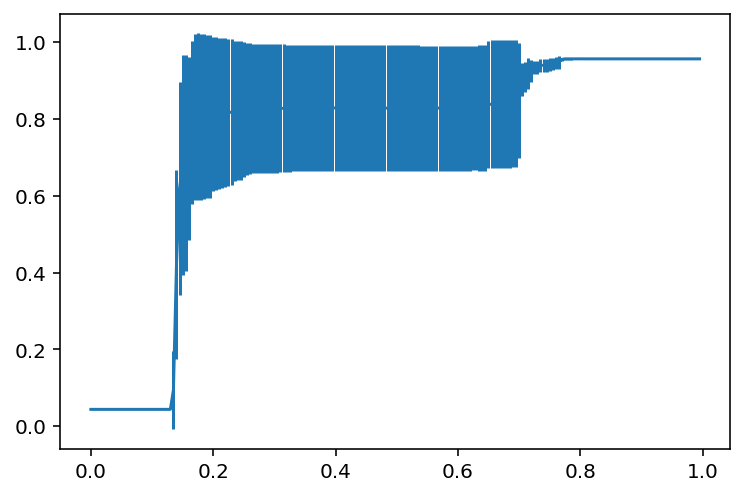

In [68]:
plt.errorbar(np.arange(0.0, 1.0, 0.005), Metrics.mean(axis=1), Metrics.std(axis=1))

### Визуализация важности признаков

In [69]:
FeatureImportances = sorted(zip(X.columns, clf.feature_importances_), 
                            key = lambda x: x[1], reverse=True)

TDA_FI = [fi for fi in FeatureImportances if fi[0].startswith('LT_')]
CorrFI = [fi for fi in FeatureImportances if fi[0].startswith('Corr_')]
InitFI = sorted(set(FeatureImportances) - set(CorrFI) - set(TDA_FI), key=lambda x: x[1], reverse=True)

#### Отдельно каждый тип признаков

<BarContainer object of 14 artists>

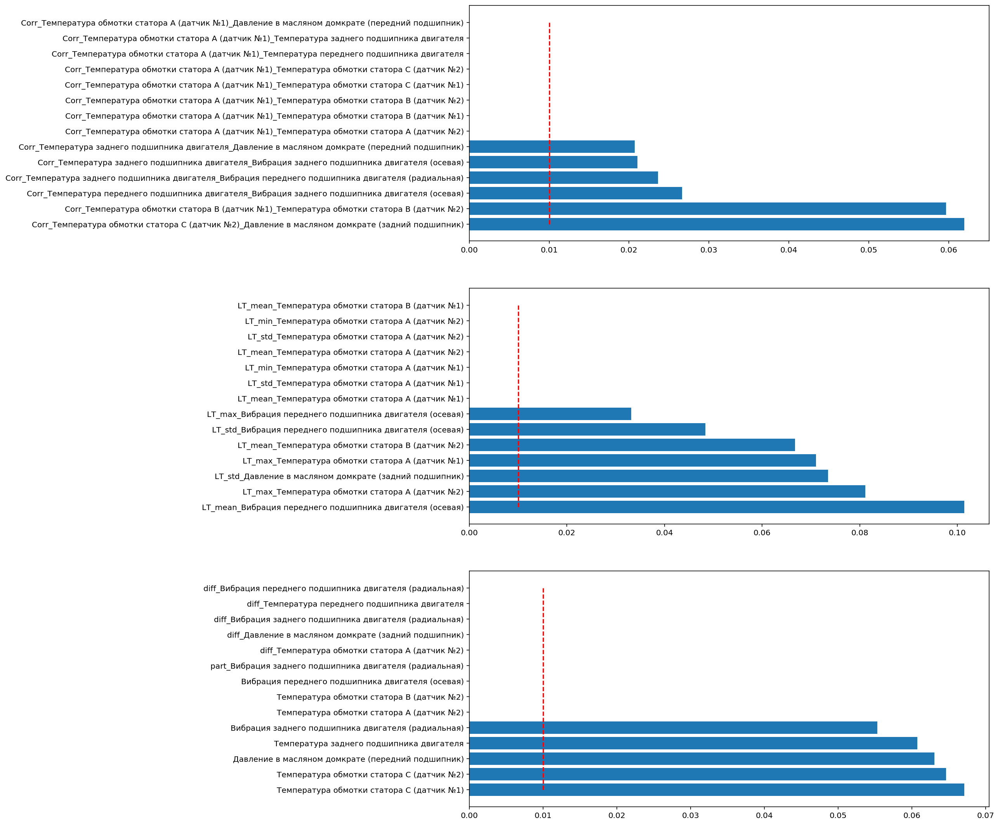

In [70]:
fig, axes = plt.subplots(3, 1, figsize=(12, 19))

TOP_N = 14

axes[0].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[0].barh(range(1, TOP_N + 1), [fi[1] for fi in CorrFI[:TOP_N]],
             tick_label=[fi[0] for fi in CorrFI[:TOP_N]])

axes[1].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[1].barh(range(1, TOP_N + 1), [fi[1] for fi in TDA_FI[:TOP_N]],
             tick_label=[fi[0] for fi in TDA_FI[:TOP_N]])

axes[2].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[2].barh(range(1, TOP_N + 1), [fi[1] for fi in InitFI[:TOP_N]],
             tick_label=[fi[0] for fi in InitFI[:TOP_N]])

#### Общий ТОП признаков

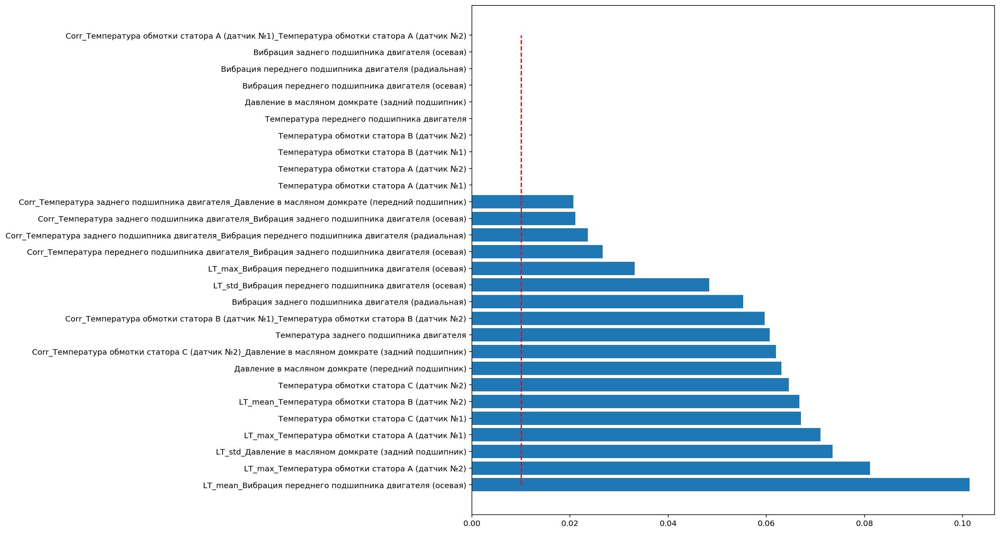

In [71]:
plt.figure(figsize=(12, 12))
plt.vlines(0.01, 1, 2 * TOP_N, colors='red', linestyle='dashed')
plt.barh(range(1, 2 * TOP_N + 1),
         [fi[1] for fi in FeatureImportances[:2 * TOP_N]],
         tick_label=[fi[0] for fi in FeatureImportances[:2 * TOP_N]])
plt.show()

### Визуализация предсказаний

In [72]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

ScaledData = pd.DataFrame(mms.fit_transform(X), columns=X.columns, index=X.index)
ScaledValData = pd.DataFrame(mms.fit_transform(Val_X), columns=Val_X.columns, index=Val_X.index)
ScaledExamData = pd.DataFrame(mms.fit_transform(Exam_X), columns=Exam_X.columns, index=Exam_X.index)

Probs = pd.Series(np.concatenate([ValProbs[:,1], ExamProbs[:,1]]), index=X.index)

In [ ]:
from concurrent.futures import 

In [73]:
import plotly.graph_objects as go
import plotly.express as px

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = ScaledData.columns[12]
sens_name_2 = ScaledData.columns[13]

Sens_1 = ScaledData[sens_name_1].values
Sens_2 = ScaledData[sens_name_2].values

fig = go.Figure()
fig.add_trace(go.Scatter(x=ScaledData.index, y=Sens_1, name="Вибрация ЗПД (осев.)"))
fig.add_trace(go.Scatter(x=ScaledData.index, y=Sens_2, name="Вибрация ЗПД (рад.)"))
fig.add_traces([
    go.Scatter(x=ScaledData.index,
               y=Data.target.values, 
               fill="tozerox",
               name="Остановки"),
    go.Scatter(x=ScaledData.index,
               y=Probs,
               fill="tozeroy",
               name="Уровень опасности"),
])

#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("Febraury_XGBoost_Results.html", config=config)

## XGBoost Gradient Boosting

### Подбор параметров на кросс-валидации

In [86]:
from tqdm.notebook import tqdm

Params = {
    "max_depth": 2,
    "learning_rate": 0.1,
    "booster": 'gbtree',
    "n_jobs": -1,
    "random_state": 42,
    "base_score": y.mean().round(3),
    "reg_alpha": 2.0,
    "reg_lambda": 3.0
}

LR_ARR = np.arange(0.02, 0.12, 0.02)
MAX_DEPTH_ARR = range(2, 15)

param_comb = list(product(LR_ARR, MAX_DEPTH_ARR))
best_f1, best_roc_auc, best_jaccard = 0.0, 0.0, 0.0
GB_RESULTS = []

for lr, max_depth in tqdm(param_comb):

    Params['max_depth'] = max_depth
    Params['learning_rate'] = lr

    CLF = XGBClassifier(**Params)
    CV_result = cross_validate(
        CLF,
        Val_X,
        Val_y,
        scoring=['f1', 'roc_auc', 'jaccard_weighted'],
        return_train_score=True,
        return_estimator=True)


    #======================================================================#
    # Сохранение результатов и метрик
    #======================================================================#
    res = dict()
    res['params'] = Params

    for part, metric in product(["train", "test"],
                                ["f1", "roc_auc", "jaccard_weighted"]):
        res[f"{part}_avg_{metric}"] = CV_result[f"{part}_{metric}"].mean()
        res[f"{part}_std_{metric}"] = CV_result[f"{part}_{metric}"].std()

    if res["test_avg_jaccard_weighted"] > best_jaccard:
        best_jaccard = res["test_avg_jaccard_weighted"]
        best_est = CV_result["estimator"]

    GB_RESULTS.append(res)

    #======================================================================#

In [87]:
!telegram-send "IoU : {best_jaccard}"

In [88]:
GB_RESULTS = pd.DataFrame(GB_RESULTS)

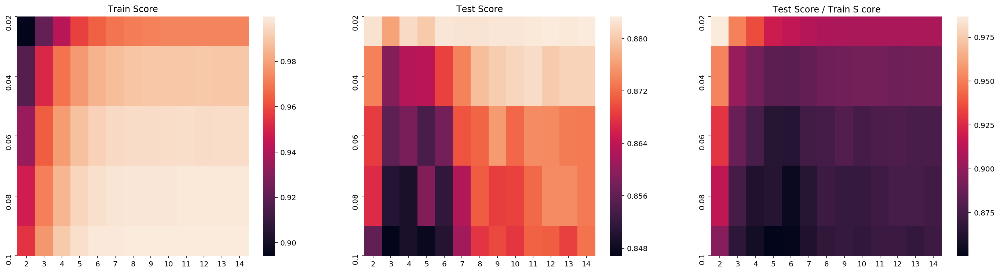

In [89]:
AVG_Train_Jaccard = GB_RESULTS['train_avg_jaccard_weighted'].values.reshape(
    len(LR_ARR), len(MAX_DEPTH_ARR))
AVG_Test_Jaccard = GB_RESULTS['test_avg_jaccard_weighted'].values.reshape(
    len(LR_ARR), len(MAX_DEPTH_ARR))

fig, axes = plt.subplots(1, 3, figsize=(24, 6))

axes[0].set_title("Train Score")
sns.heatmap(AVG_Train_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=LR_ARR.round(2),
            ax=axes[0])

axes[1].set_title("Test Score")
sns.heatmap(AVG_Test_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=LR_ARR.round(2),
            ax=axes[1])

axes[2].set_title("Test Score / Train S core")
sns.heatmap(AVG_Test_Jaccard / AVG_Train_Jaccard,
            xticklabels=MAX_DEPTH_ARR,
            yticklabels=LR_ARR.round(2),
            ax=axes[2])

In [90]:
for i, clf in enumerate(best_est):
    ValPreds = clf.predict(Val_X)
    ExamPreds = clf.predict(Exam_X)
    ValProbs = clf.predict_proba(Val_X)
    ExamProbs = clf.predict_proba(Exam_X)

    print(60 * "=")
    print(f"{i+1}-й Классификатор")
    print(60 * "=")

    print("Val Report:\n")
    print(classification_report(Val_y, ValPreds))
    print("Exam Report:\n")
    print(classification_report(Exam_y, ExamPreds))


1-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      5412
         1.0       0.98      0.64      0.77       346

    accuracy                           0.98      5758
   macro avg       0.98      0.82      0.88      5758
weighted avg       0.98      0.98      0.98      5758

Exam Report:

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      2717
         1.0       0.00      0.00      0.00       125

    accuracy                           0.96      2842
   macro avg       0.48      0.50      0.49      2842
weighted avg       0.91      0.96      0.93      2842

2-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      5412
         1.0       1.00      0.64      0.78       346

    accuracy                           0.98      5758
   macro avg       0.99      0.82      0.89      575

In [91]:
def predict(clf, thrs, X):
    return (clf.predict_proba(X)[:,1] > thrs).astype(int)

Metrics = []
for thrs in tqdm(np.arange(0.0, 1.0, 0.005)):
    clf_metrics = []
    for clf in best_est:
        preds = predict(clf, thrs, Exam_X)
        clf_metrics.append(IoU(Exam_y, preds))
    Metrics.append(clf_metrics)
    
Metrics = np.array(Metrics)

<ErrorbarContainer object of 3 artists>

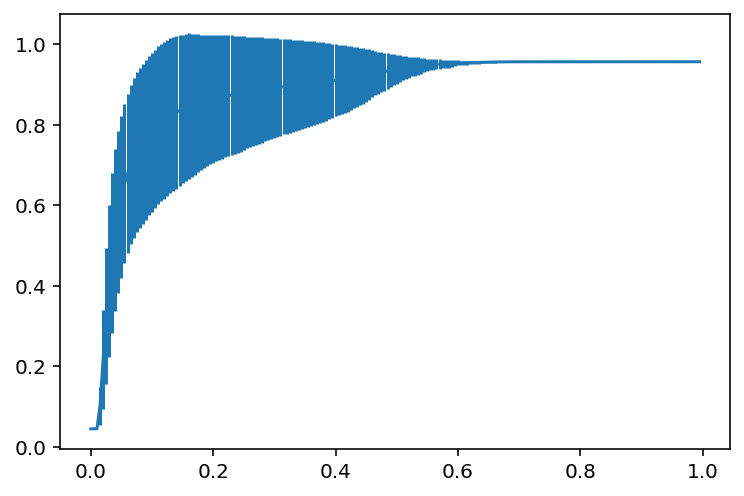

In [92]:
plt.errorbar(np.arange(0.0, 1.0, 0.005), Metrics.mean(axis=1), Metrics.std(axis=1))

### Визуализация важности признаков

In [93]:
FeatureImportances = sorted(zip(X.columns, clf.feature_importances_), 
                            key = lambda x: x[1], reverse=True)

TDA_FI = [fi for fi in FeatureImportances if fi[0].startswith('LT_')]
CorrFI = [fi for fi in FeatureImportances if fi[0].startswith('Corr_')]
InitFI = sorted(set(FeatureImportances) - set(CorrFI) - set(TDA_FI), key=lambda x: x[1], reverse=True)

#### Отдельно каждый тип признаков

<BarContainer object of 14 artists>

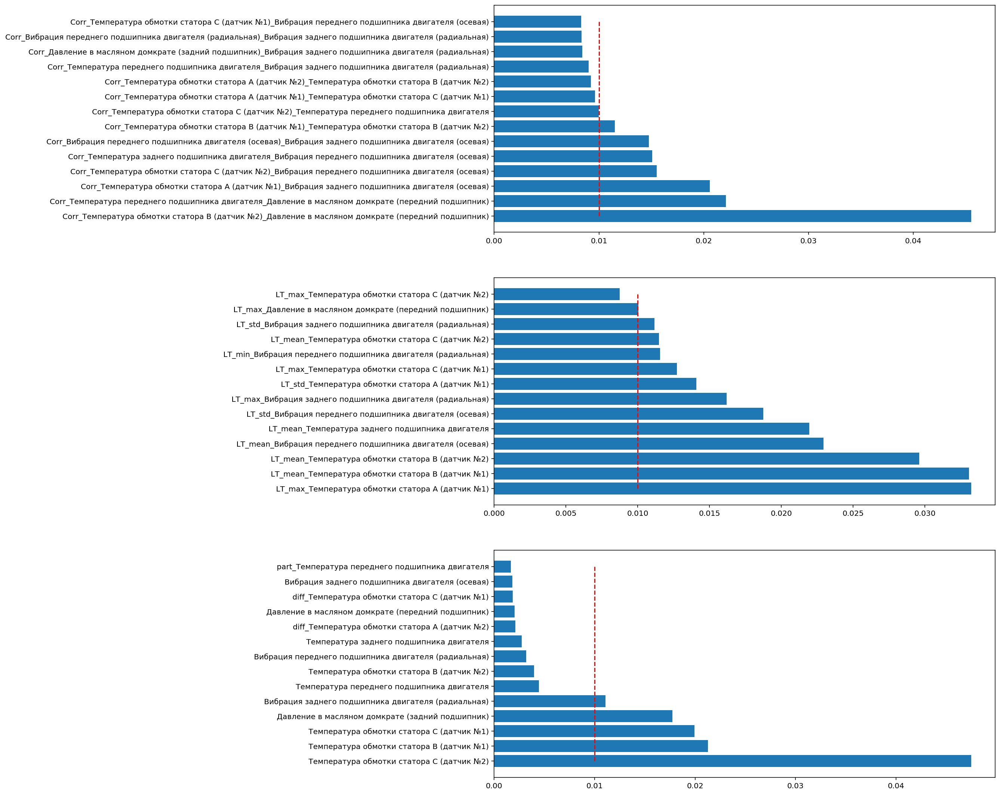

In [94]:
fig, axes = plt.subplots(3, 1, figsize=(12, 19))

TOP_N = 14

axes[0].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[0].barh(range(1, TOP_N + 1), [fi[1] for fi in CorrFI[:TOP_N]],
             tick_label=[fi[0] for fi in CorrFI[:TOP_N]])

axes[1].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[1].barh(range(1, TOP_N + 1), [fi[1] for fi in TDA_FI[:TOP_N]],
             tick_label=[fi[0] for fi in TDA_FI[:TOP_N]])

axes[2].vlines(0.01, 1, TOP_N, colors='red', linestyle='dashed')
axes[2].barh(range(1, TOP_N + 1), [fi[1] for fi in InitFI[:TOP_N]],
             tick_label=[fi[0] for fi in InitFI[:TOP_N]])

#### Общий ТОП признаков

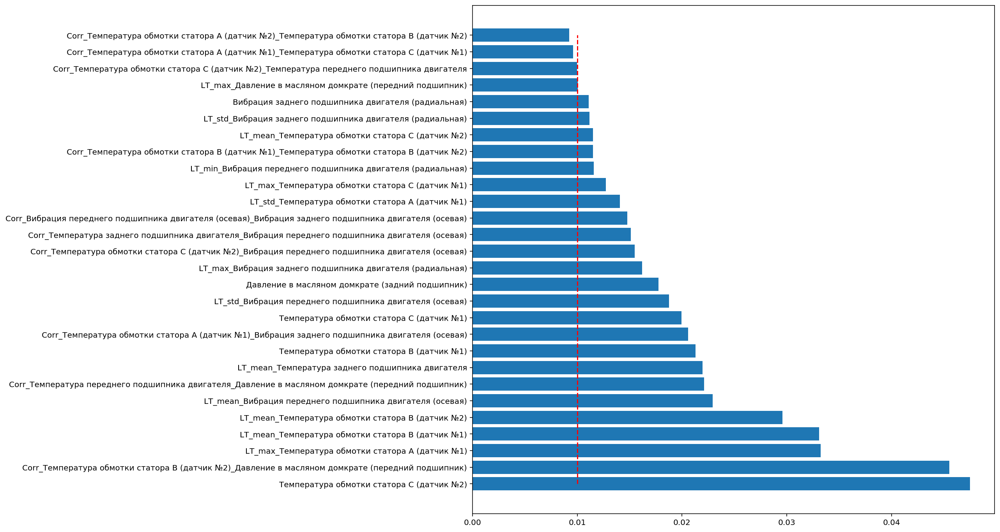

In [95]:
plt.figure(figsize=(12, 12))
plt.vlines(0.01, 1, 2 * TOP_N, colors='red', linestyle='dashed')
plt.barh(range(1, 2 * TOP_N + 1),
         [fi[1] for fi in FeatureImportances[:2 * TOP_N]],
         tick_label=[fi[0] for fi in FeatureImportances[:2 * TOP_N]])
plt.show()

### Визуализация предсказаний

In [96]:
from sklearn.preprocessing import MinMaxScaler
mms = MinMaxScaler()

ScaledData = pd.DataFrame(mms.fit_transform(X), columns=X.columns, index=X.index)
ScaledValData = pd.DataFrame(mms.fit_transform(Val_X), columns=Val_X.columns, index=Val_X.index)
ScaledExamData = pd.DataFrame(mms.fit_transform(Exam_X), columns=Exam_X.columns, index=Exam_X.index)

Probs = pd.Series(np.concatenate([ValProbs[:,1], ExamProbs[:,1]]), index=X.index)

In [97]:
import plotly.graph_objects as go
import plotly.express as px

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = ScaledData.columns[12]
sens_name_2 = ScaledData.columns[13]

Sens_1 = ScaledData[sens_name_1].values
Sens_2 = ScaledData[sens_name_2].values

fig = go.Figure()

fig.add_traces([
    go.Scatter(x=ScaledData.index,
               y=Sens_1,
               name="Вибрация ЗПД (осев.)"),
    go.Scatter(x=ScaledData.index,
               y=Sens_2,
               name="Вибрация ЗПД (рад.)"),
    go.Scatter(x=ScaledData.index,
               y=Data.target.values, 
               fill="tozerox",
               name="Остановки"),
    go.Scatter(x=ScaledData.index,
               y=Probs,
               fill="tozeroy",
               name="Уровень опасности"),
])

#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("Febraury_XGBoost_Results.html", config=config)

## Logistic Regression

In [98]:
from sklearn.linear_model import LogisticRegression

In [99]:
clf = LogisticRegression(penalty='l1', solver='saga', l1_ratio=2.0)
CV_result = cross_validate(
        clf,
        Val_X,
        Val_y,
        scoring=['f1', 'roc_auc', 'jaccard_weighted'],
        return_train_score=True,
        return_estimator=True)

In [100]:
pd.DataFrame(CV_result)

,fit_time,score_time,estimator,test_f1,train_f1,test_roc_auc,train_roc_auc,test_jaccard_weighted,train_jaccard_weighted
0,1.236770,0.006844,"LogisticRegression(C=1.0, class_weight=None, d...",0.024390,0.482940,0.731463,0.921866,0.875502,0.917988
1,1.264603,0.005194,"LogisticRegression(C=1.0, class_weight=None, d...",0.000000,0.523929,0.556854,0.927187,0.862578,0.921751
2,1.182445,0.005006,"LogisticRegression(C=1.0, class_weight=None, d...",0.088235,0.488189,0.422498,0.932551,0.840413,0.918809
3,1.208581,0.005446,"LogisticRegression(C=1.0, class_weight=None, d...",0.072727,0.501292,0.444708,0.923374,0.774536,0.919764
4,1.191297,0.005410,"LogisticRegression(C=1.0, class_weight=None, d...",0.022883,0.555000,0.434890,0.921797,0.590482,0.925757


In [101]:
from sklearn.metrics import jaccard_score

Metrics = []
for i, clf in enumerate(CV_result['estimator']):
    Preds = clf.predict(Exam_X)
    Probs = clf.predict_proba(Exam_X)
    
    roc_auc = roc_auc_score(Exam_y, Probs[:,1])
    IoU_score = jaccard_score(Exam_y, Preds, average='micro')
    Metrics.append([roc_auc, IoU_score])
    
    
    print(f"{i}-ый классификатор")
    print(f"ROC AUC : {roc_auc}\nIoU : {IoU_score}")
    print("="*20)
    
Metrics = np.array(Metrics)
print(f"\nAverage ROC AUC: {Metrics.mean(axis=0)[0]}\nAverage IoU: {Metrics.mean(axis=0)[1]}")

0-ый классификатор
ROC AUC : 0.5225616488774384
IoU : 0.8746701846965699
1-ый классификатор
ROC AUC : 0.42677659182922345
IoU : 0.8802514058881905
2-ый классификатор
ROC AUC : 0.30600220831799774
IoU : 0.8915141430948419
3-ый классификатор
ROC AUC : 0.45357379462642616
IoU : 0.8264781491002571
4-ый классификатор
ROC AUC : 0.36604195804195805
IoU : 0.2690332663540969

Average ROC AUC: 0.4149912403386088
Average IoU: 0.7483894298267912


### Визуализация важности признаков

<BarContainer object of 189 artists>

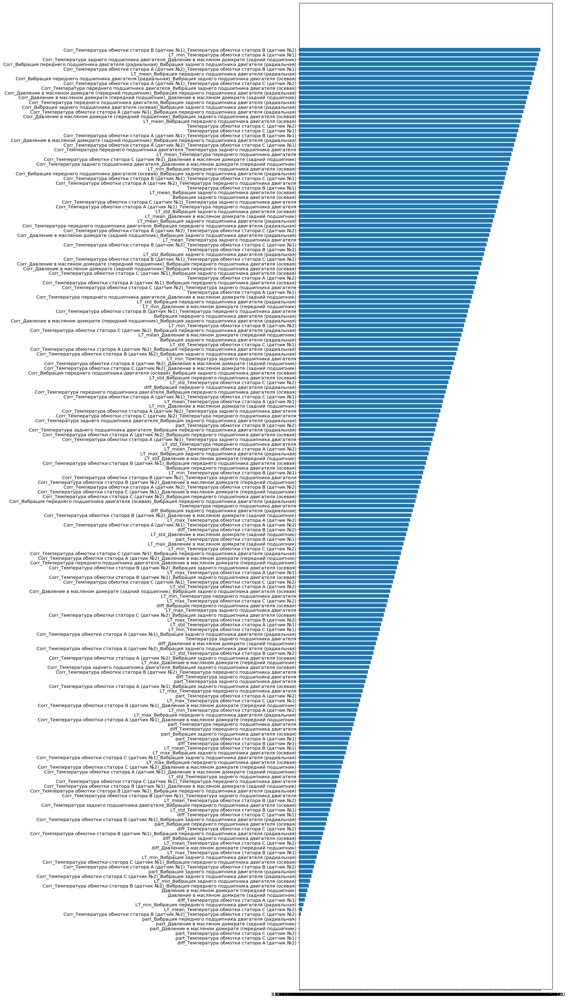

In [102]:
to_plot = [[feat, abs(coef)] for feat, coef in zip(Exam_X.columns, clf.coef_.ravel())]
to_plot = np.array(sorted(to_plot, key = lambda x: x[1]))

plt.figure(figsize=(10,40))
plt.barh(to_plot[:,0], to_plot[:, 1])

## Neural Network

In [103]:
from sklearn.neural_network import MLPClassifier

In [104]:
print(f"Количество признаков: {X.shape[1]}")

Количество признаков: 189


In [115]:
clf = MLPClassifier(hidden_layer_sizes=(189,161,80,161,189), learning_rate_init=0.0005)

CV_result = cross_validate(
        clf,
        Val_X,
        Val_y,
        scoring=['f1', 'roc_auc', 'jaccard_weighted'],
        return_train_score=True,
        return_estimator=True)

In [116]:
best_est = CV_result['estimator']

for i, clf in enumerate(best_est):
    ValPreds = clf.predict(Val_X)
    ExamPreds = clf.predict(Exam_X)
    ValProbs = clf.predict_proba(Val_X)
    ExamProbs = clf.predict_proba(Exam_X)

    print(60 * "=")
    print(f"{i+1}-й Классификатор")
    print(60 * "=")

    print("Val Report:\n")
    print(classification_report(Val_y, ValPreds))
    print("Exam Report:\n")
    print(classification_report(Exam_y, ExamPreds))



1-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.99      0.99      0.99      5412
         1.0       0.83      0.81      0.82       346

    accuracy                           0.98      5758
   macro avg       0.91      0.90      0.90      5758
weighted avg       0.98      0.98      0.98      5758

Exam Report:

              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      2717
         1.0       0.14      0.06      0.08       125

    accuracy                           0.94      2842
   macro avg       0.55      0.52      0.53      2842
weighted avg       0.92      0.94      0.93      2842

2-й Классификатор
Val Report:

              precision    recall  f1-score   support

         0.0       0.99      1.00      0.99      5412
         1.0       0.98      0.81      0.89       346

    accuracy                           0.99      5758
   macro avg       0.98      0.90      0.94      575

In [117]:
Metrics = []
for i, clf in enumerate(CV_result['estimator']):
    Preds = clf.predict(Exam_X)
    Probs = clf.predict_proba(Exam_X)
    
    roc_auc = roc_auc_score(Exam_y, Probs[:,1])
    IoU_score = jaccard_score(Exam_y, Preds, average='micro')
    Metrics.append([roc_auc, IoU_score])
    
    
    print(f"{i}-ый классификатор")
    print(f"ROC AUC : {roc_auc}\nIoU : {IoU_score}")
    print("="*20)
    
Metrics = np.array(Metrics)
print(f"\nAverage ROC AUC: {Metrics.mean(axis=0)[0]}\nAverage IoU: {Metrics.mean(axis=0)[1]}")

0-ый классификатор
ROC AUC : 0.5329642988590357
IoU : 0.8921438082556591
1-ый классификатор
ROC AUC : 0.30602870813397126
IoU : 0.895930620413609
2-ый классификатор
ROC AUC : 0.47744423997055574
IoU : 0.9157398045163465
3-ый классификатор
ROC AUC : 0.44522635259477367
IoU : 0.8946666666666667
4-ый классификатор
ROC AUC : 0.3670253956569746
IoU : 0.5736434108527132

Average ROC AUC: 0.4257377990430622
Average IoU: 0.8344248621409989


In [118]:
import plotly.graph_objects as go
import plotly.express as px


ValProbs = best_est[0].predict_proba(Val_X)
ExamProbs = best_est[0].predict_proba(Exam_X)

Probs = pd.Series(np.concatenate([ValProbs[:,1], ExamProbs[:,1]]), index=X.index)

config = dict({'scrollZoom': True})

import pandas as pd
sens_name_1 = ScaledData.columns[12]
sens_name_2 = ScaledData.columns[13]

Sens_1 = ScaledData[sens_name_1].values
Sens_2 = ScaledData[sens_name_2].values

fig = go.Figure()

fig.add_traces([
    go.Scatter(x=ScaledData.index,
               y=Sens_1,
               name="Вибрация ЗПД (осев.)"),
    go.Scatter(x=ScaledData.index,
               y=Sens_2,
               name="Вибрация ЗПД (рад.)"),
    go.Scatter(x=ScaledData.index,
               y=Data.target.values, 
               fill="tozerox",
               name="Остановки"),
    go.Scatter(x=ScaledData.index,
               y=Data.shift_target.values, 
               fill="tozerox",
               name="Смещенные Остановки"),
    go.Scatter(x=ScaledData.index,
               y=Probs,
               fill="tozeroy",
               name="Уровень опасности"),
])

#==========================================================================================#

# fig.update_xaxes(rangeslider_visible=True)
fig.show(config=config)
# fig.write_html("Febraury_XGBoost_Results.html", config=config)

# EOF